In [ ]:
!pip install kaggle


In [ ]:
import os

os.environ['KAGGLE_CONFIG_DIR'] = "/content"


In [ ]:
!kaggle datasets download -d alsaniipe/flowers-dataset


flowers-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip flowers-dataset.zip -d flowers-dataset


Archive:  flowers-dataset.zip
  inflating: flowers-dataset/README.dataset.txt  
  inflating: flowers-dataset/README.roboflow.txt  
  inflating: flowers-dataset/test/daisy/10466290366_cc72e33532_jpg.rf.6ddc91cd5d4a6a683e567ccb37e5a089.jpg  
  inflating: flowers-dataset/test/daisy/10466558316_a7198b87e2_jpg.rf.7acf642b94dc98daa49482a12994ac4c.jpg  
  inflating: flowers-dataset/test/daisy/12193032636_b50ae7db35_n_jpg.rf.e6c4eeb71c56e793a0d85f6d979dbe20.jpg  
  inflating: flowers-dataset/test/daisy/1342002397_9503c97b49_jpg.rf.8fe6bdd23186b70f089bb0c5b89d314e.jpg  
  inflating: flowers-dataset/test/daisy/1354396826_2868631432_m_jpg.rf.409eee37613d16dbc71365cb5615327e.jpg  
  inflating: flowers-dataset/test/daisy/1374193928_a52320eafa_jpg.rf.e398f632151f3ccc5729bc89527d7614.jpg  
  inflating: flowers-dataset/test/daisy/1392131677_116ec04751_jpg.rf.da99f9bb579ee96dc1728545ca519d6f.jpg  
  inflating: flowers-dataset/test/daisy/14333681205_a07c9f1752_m_jpg.rf.6ff96d9fe33f0bd19a18425f32d470b1.j

(512, 512)


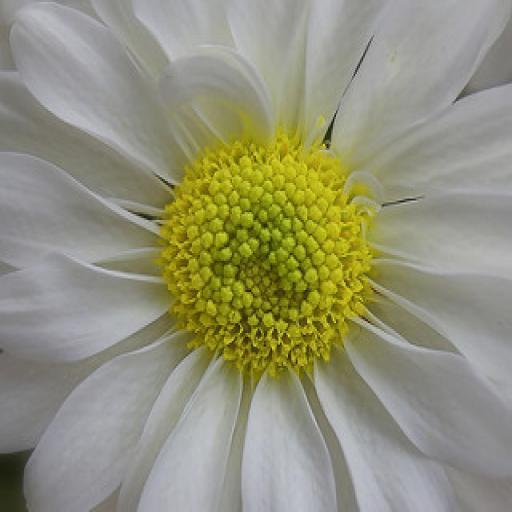

In [ ]:
import PIL
from PIL import Image
img=Image.open("/content/flowers-dataset/train/daisy/100080576_f52e8ee070_n_jpg.rf.7304a94072d861e72591569a23415323.jpg")
print(img.size)
img

In [ ]:
import torch
# if torch.cuda.is_available():
#     tensor = tensor.to("cuda")

In [ ]:
from torchvision import datasets, transforms
train_transform = transforms.Compose([
                                transforms.RandomHorizontalFlip(),
                                transforms.ColorJitter(),
                                transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()])
test_transform = transforms.Compose([
                                transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()])
valid_transform = transforms.Compose([
                                transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()])
train_data = datasets.ImageFolder("/content/flowers-dataset/train", transform=train_transform)
test_data = datasets.ImageFolder("/content/flowers-dataset/test", transform=test_transform)
valid_data = datasets.ImageFolder("/content/flowers-dataset/valid", transform=valid_transform)



In [ ]:

print(len(train_data))
train_data[600]
#3d tensor representation of an image

1275


(tensor([[[0.6000, 0.5882, 0.5804,  ..., 0.7373, 0.7490, 0.7412],
          [0.5922, 0.5843, 0.5725,  ..., 0.7451, 0.7529, 0.7412],
          [0.5765, 0.5725, 0.5686,  ..., 0.7569, 0.7608, 0.7451],
          ...,
          [0.4980, 0.5373, 0.5843,  ..., 0.5412, 0.6157, 0.6824],
          [0.5333, 0.5725, 0.6353,  ..., 0.5608, 0.6000, 0.6510],
          [0.5725, 0.6275, 0.6784,  ..., 0.6000, 0.6039, 0.6118]],
 
         [[0.6078, 0.5961, 0.5882,  ..., 0.7059, 0.7176, 0.7020],
          [0.6000, 0.5922, 0.5804,  ..., 0.7176, 0.7216, 0.7020],
          [0.5843, 0.5804, 0.5765,  ..., 0.7255, 0.7294, 0.7098],
          ...,
          [0.5059, 0.5412, 0.5843,  ..., 0.4824, 0.5608, 0.6235],
          [0.5412, 0.5725, 0.6353,  ..., 0.5020, 0.5412, 0.5922],
          [0.5804, 0.6275, 0.6784,  ..., 0.5412, 0.5529, 0.5608]],
 
         [[0.5608, 0.5490, 0.5373,  ..., 0.6471, 0.6588, 0.6627],
          [0.5529, 0.5412, 0.5294,  ..., 0.6549, 0.6667, 0.6667],
          [0.5412, 0.5373, 0.5255,  ...,

In [ ]:
print(len(test_data))
test_data[0]

182


(tensor([[[0.3373, 0.3255, 0.3294,  ..., 0.4784, 0.4235, 0.4039],
          [0.3137, 0.3333, 0.3412,  ..., 0.5255, 0.4784, 0.4353],
          [0.2980, 0.3412, 0.3647,  ..., 0.5647, 0.5176, 0.4549],
          ...,
          [0.1490, 0.1569, 0.1333,  ..., 0.2392, 0.2745, 0.2588],
          [0.1020, 0.1490, 0.2235,  ..., 0.2784, 0.2784, 0.2431],
          [0.0353, 0.0706, 0.1725,  ..., 0.3255, 0.2902, 0.2549]],
 
         [[0.2824, 0.2706, 0.2627,  ..., 0.3529, 0.2941, 0.2824],
          [0.2549, 0.2706, 0.2745,  ..., 0.4039, 0.3490, 0.3098],
          [0.2353, 0.2706, 0.2863,  ..., 0.4431, 0.3961, 0.3333],
          ...,
          [0.2039, 0.2000, 0.1686,  ..., 0.2314, 0.2353, 0.2196],
          [0.1608, 0.1922, 0.2627,  ..., 0.2588, 0.2392, 0.2000],
          [0.0941, 0.1216, 0.2314,  ..., 0.3176, 0.2667, 0.2196]],
 
         [[0.2549, 0.2431, 0.2353,  ..., 0.3882, 0.3255, 0.3294],
          [0.2275, 0.2431, 0.2471,  ..., 0.4392, 0.3804, 0.3529],
          [0.2078, 0.2471, 0.2627,  ...,

In [ ]:
print(len(valid_data))
valid_data[240]

364


(tensor([[[0.4627, 0.5373, 0.5725,  ..., 0.5961, 0.4863, 0.4784],
          [0.4118, 0.4314, 0.5137,  ..., 0.5255, 0.4745, 0.4784],
          [0.4549, 0.4157, 0.4314,  ..., 0.4745, 0.4784, 0.4784],
          ...,
          [0.4667, 0.4706, 0.4745,  ..., 0.8353, 0.8353, 0.8235],
          [0.4627, 0.4667, 0.4706,  ..., 0.8431, 0.8392, 0.8314],
          [0.4667, 0.4745, 0.4706,  ..., 0.8510, 0.8471, 0.8431]],
 
         [[0.4980, 0.5647, 0.5922,  ..., 0.5725, 0.4667, 0.4627],
          [0.4549, 0.4667, 0.5412,  ..., 0.5059, 0.4588, 0.4588],
          [0.4941, 0.4510, 0.4667,  ..., 0.4627, 0.4627, 0.4549],
          ...,
          [0.3686, 0.3725, 0.3686,  ..., 0.5804, 0.5804, 0.5765],
          [0.3647, 0.3686, 0.3647,  ..., 0.5882, 0.5843, 0.5804],
          [0.3608, 0.3608, 0.3569,  ..., 0.5843, 0.5804, 0.5804]],
 
         [[0.3373, 0.4392, 0.5176,  ..., 0.4980, 0.3608, 0.3176],
          [0.2353, 0.2863, 0.4118,  ..., 0.3922, 0.3216, 0.3294],
          [0.2863, 0.2588, 0.2980,  ...,

In [ ]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=32,shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=32)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=32)

<ipython-input-19-397af71b4333>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(12, 6))


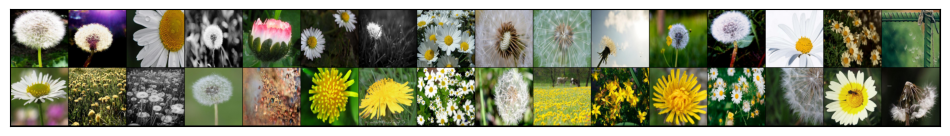

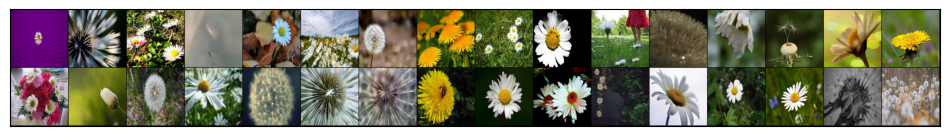

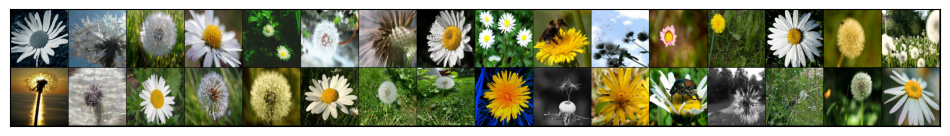

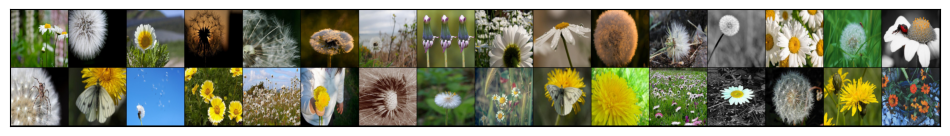

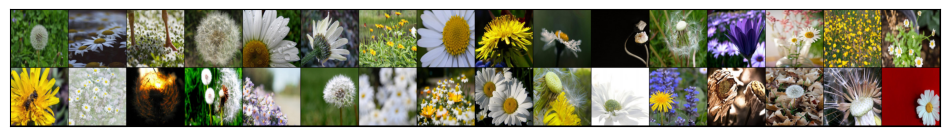

...

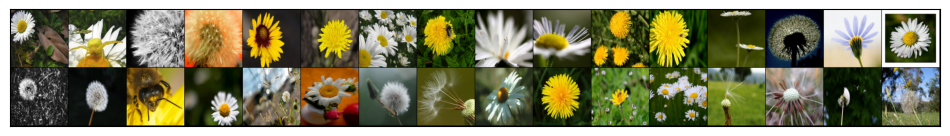

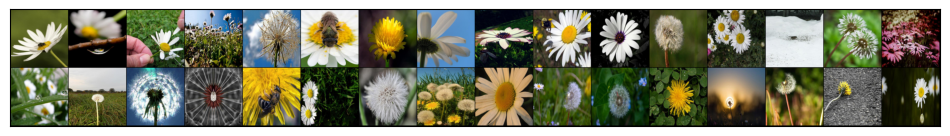

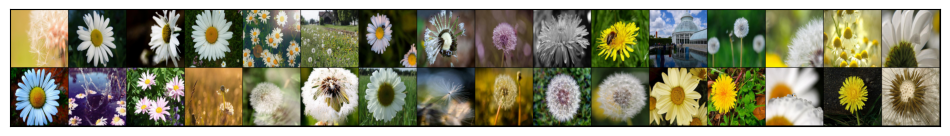

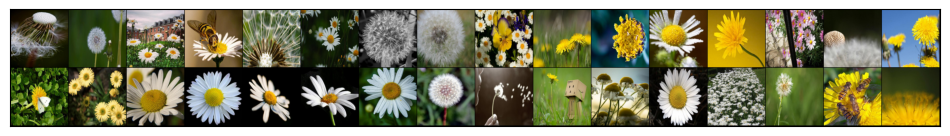

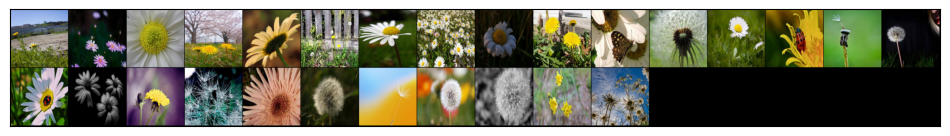

In [ ]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
def show_batch(dl, invert=True):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(12, 6))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=16).permute(1, 2, 0))

def show_sample(image, label, invert=True):
    print('Label: ' + train_data.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
show_batch(train_loader, invert=True)

In [ ]:
train_data.classes

['daisy', 'dandelion']

In [ ]:



import torch
import torch.nn as nn
import torch.nn.init as init
import math

class MyLinearLayer(nn.Module):
    """ Custom Linear layer but mimics a standard linear layer """
    def __init__(self, input_size, output_size):
        super().__init__()
        self.input_size, self.output_size = input_size, output_size
        weights = torch.Tensor(output_size, input_size) # creates a matrix of size output x input where wij represent weights between ith input neuron to jth output neuron
        self.weights = nn.Parameter(weights)  # nn.Parameter is a Tensor that's a module parameter.
        bias = torch.Tensor(output_size) # bias is added while sending to the output neuron
        self.bias = nn.Parameter(bias) # bias is also declared as model parameter

        # initialize weights and biases
        nn.init.kaiming_uniform_(self.weights, a=math.sqrt(5)) # weight initialising

        bound = 1 / math.sqrt(self.input_size)
        nn.init.uniform_(self.bias, -bound, bound)  # bias initialisng

    def forward(self, x):
        # Linear operation: y = x * W^T + b
        w_times_x = torch.mm(x, self.weights.t())  # Matrix multiplication of input x and transposed weights W
        output = torch.add(w_times_x, self.bias)  # Element-wise addition of w_times_x and bias b
        return output



In [ ]:
import torch.nn as nn
import torch.nn.functional as F


class NN_2(nn.Module):
    def __init__(self):
        super(NN_2, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout2d(0.2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.batchnorm2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout2d(0.2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.batchnorm3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout2d(0.2)

        self.flatten = nn.Flatten()

        self.fc1 = MyLinearLayer(128 * 28 * 28, 128)
        self.batchnorm_fc1 = nn.BatchNorm1d(128)
        self.dropout_fc = nn.Dropout(0.2)

        self.fc2 = MyLinearLayer(128, 64)
        self.batchnorm_fc2 = nn.BatchNorm1d(64)

        self.fc3 = MyLinearLayer(64, 32)
        self.batchnorm_fc3 = nn.BatchNorm1d(32)

        self.fc4 = MyLinearLayer(32, 2)




    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.batchnorm1(x)
        x = self.pool1(x)
        x = self.dropout1(x)

        x = F.relu(self.conv2(x))
        x = self.batchnorm2(x)
        x = self.pool2(x)
        x = self.dropout2(x)

        x = F.relu(self.conv3(x))
        x = self.batchnorm3(x)
        x = self.pool3(x)
        x = self.dropout3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.batchnorm_fc1(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc2(x))
        x = self.batchnorm_fc2(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc3(x))
        x = self.batchnorm_fc3(x)
        x = self.dropout_fc(x)

        x = self.fc4(x)

        return F.softmax(x, dim=1)

class NN_1(nn.Module):
    def __init__(self):
        super(NN_1, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout2d(0.2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.batchnorm2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout2d(0.2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.batchnorm3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout2d(0.2)

        self.flatten = nn.Flatten()

        self.fc1 = MyLinearLayer(128 * 28 * 28, 32)
        self.batchnorm_fc1 = nn.BatchNorm1d(32)
        self.dropout_fc = nn.Dropout(0.2)

        self.fc2 = MyLinearLayer(32 , 64)
        self.batchnorm_fc2 = nn.BatchNorm1d(64)

        self.fc3 = MyLinearLayer(64 , 128)
        self.batchnorm_fc3 = nn.BatchNorm1d(128)

        self.fc4 = MyLinearLayer(128, 2)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.batchnorm1(x)
        x = self.pool1(x)
        x = self.dropout1(x)

        x = F.relu(self.conv2(x))
        x = self.batchnorm2(x)
        x = self.pool2(x)
        x = self.dropout2(x)

        x = F.relu(self.conv3(x))
        x = self.batchnorm3(x)
        x = self.pool3(x)
        x = self.dropout3(x)

        x = self.flatten(x)

        x = F.relu(self.fc1(x))
        x = self.batchnorm_fc1(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc2(x))
        x = self.batchnorm_fc2(x)
        x = self.dropout_fc(x)

        x = F.relu(self.fc3(x))
        x = self.batchnorm_fc3(x)
        x = self.dropout_fc(x)

        x = self.fc4(x)

        return F.softmax(x, dim=1)


In [ ]:
device = "cpu"
if (torch.cuda.is_available()):
    device = "cuda"

# Create an instance of the model class and allocate it to the device
model1 = NN_1().to(device)
print("MODEL 1 : layer size increasing to 2x and then reducing to 2")
print(model1)

model2 = NN_2().to(device)
print("MODEL 2 : layer size gradually reducing to 2")
print(model2)


MODEL 1 : layer size increasing to 2x and then reducing to 2
NN_1(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout2d(p=0.2, inplace=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout2d(p=0.2, inplace=False)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batchnorm3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout3): Dropout2d(p=0.2, inplace=False)
  (flatten): Flat

In [ ]:

import numpy as np
import torch.optim as optim
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Validation Function
def valid(model, val_loader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for sample, target in val_loader:
            sample = sample.to(device).float()
            target = target.to(device).long()
            outputs = model(sample)
            _, predicted = torch.max(outputs.data, 1)

            total += target.size(0)
            correct += (predicted == target).sum().item()

    val_accuracy = 100 * correct / total
    return [], val_accuracy

def train(model, optimizer, train_loader, val_loader, n_epoch, device):
    criterion = nn.CrossEntropyLoss()
    result = []
    val_res = []

    for e in range(n_epoch):
        model.train()
        correct, total_loss = 0, 0
        total = 0

        for sample, target in train_loader:
            sample, target = sample.to(device).float(), target.to(device).long()
            optimizer.zero_grad()
            outputs= model(sample)
            loss1 = criterion(outputs, target)
            loss = loss1
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += target.size(0)
            correct += (predicted == target).sum().item()

        acc_train = 100 * correct / total
        _, val_acc = valid(model, valid_loader, device)
        print(f'Epoch: [{e+1}/{n_epoch}], Loss: {total_loss / total:.4f}, Train Acc: {acc_train:.2f}, Val Acc: {val_acc:.2f}')

        result.append(acc_train)
        val_res.append(val_acc)
   # Save results to files
    np.savetxt('result.csv', np.array(result), fmt='%.2f', delimiter=',')
    np.savetxt('val_result.csv', np.array(val_res), fmt='%.2f', delimiter=',')









In [ ]:

def plot():
    train_data = np.loadtxt('result.csv', delimiter=',')
    val_data = np.loadtxt('val_result.csv', delimiter=',')
    plt.figure()
    plt.plot(range(1, len(train_data) + 1), train_data, color='blue', label='Train')
    plt.plot(range(1, len(val_data) + 1), val_data, color='red', label='Validation')
    plt.legend()
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Accuracy (%)', fontsize=14)
    plt.title('Train and Validation Accuracy', fontsize=16)
    plt.savefig('plot.png')
    plt.show()


Epoch: [1/30], Loss: 0.0208, Train Acc: 59.61, Val Acc: 56.32
Epoch: [2/30], Loss: 0.0203, Train Acc: 62.82, Val Acc: 68.96
Epoch: [3/30], Loss: 0.0197, Train Acc: 66.12, Val Acc: 72.53
Epoch: [4/30], Loss: 0.0186, Train Acc: 70.51, Val Acc: 71.43
Epoch: [5/30], Loss: 0.0179, Train Acc: 73.96, Val Acc: 73.08
Epoch: [6/30], Loss: 0.0178, Train Acc: 74.67, Val Acc: 76.10
Epoch: [7/30], Loss: 0.0173, Train Acc: 75.61, Val Acc: 75.27
Epoch: [8/30], Loss: 0.0167, Train Acc: 78.67, Val Acc: 77.20
Epoch: [9/30], Loss: 0.0162, Train Acc: 78.90, Val Acc: 77.20
Epoch: [10/30], Loss: 0.0164, Train Acc: 78.51, Val Acc: 74.18
Epoch: [11/30], Loss: 0.0157, Train Acc: 81.02, Val Acc: 72.53
Epoch: [12/30], Loss: 0.0155, Train Acc: 82.12, Val Acc: 77.20
Epoch: [13/30], Loss: 0.0157, Train Acc: 81.33, Val Acc: 75.00
Epoch: [14/30], Loss: 0.0151, Train Acc: 83.45, Val Acc: 79.40
Epoch: [15/30], Loss: 0.0151, Train Acc: 82.82, Val Acc: 79.40
Epoch: [16/30], Loss: 0.0144, Train Acc: 85.10, Val Acc: 78.02
E

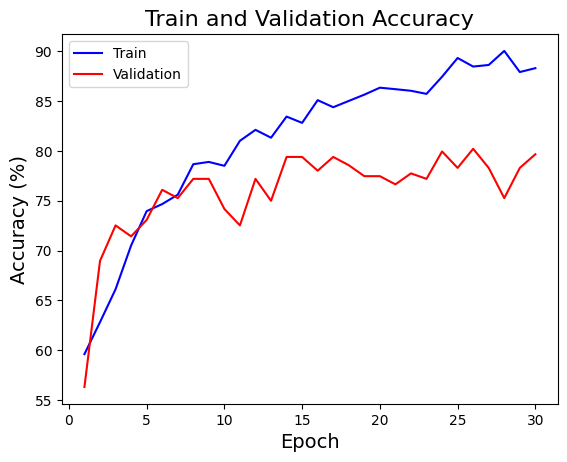

In [ ]:
optimizer = optim.SGD(model1.parameters(), lr=0.001, momentum=0.9)
train(model1, optimizer, train_loader, valid_loader, n_epoch=30, device=device)
plot()

Epoch: [1/30], Loss: 0.0202, Train Acc: 64.78, Val Acc: 59.34
Epoch: [2/30], Loss: 0.0183, Train Acc: 73.49, Val Acc: 63.74
Epoch: [3/30], Loss: 0.0179, Train Acc: 75.61, Val Acc: 75.27
Epoch: [4/30], Loss: 0.0171, Train Acc: 79.45, Val Acc: 74.18
Epoch: [5/30], Loss: 0.0166, Train Acc: 79.69, Val Acc: 78.02
Epoch: [6/30], Loss: 0.0162, Train Acc: 80.78, Val Acc: 77.47
Epoch: [7/30], Loss: 0.0161, Train Acc: 80.86, Val Acc: 76.92
Epoch: [8/30], Loss: 0.0158, Train Acc: 81.18, Val Acc: 76.37
Epoch: [9/30], Loss: 0.0153, Train Acc: 83.37, Val Acc: 78.30
Epoch: [10/30], Loss: 0.0152, Train Acc: 83.84, Val Acc: 77.75
Epoch: [11/30], Loss: 0.0150, Train Acc: 84.86, Val Acc: 81.04
Epoch: [12/30], Loss: 0.0144, Train Acc: 87.37, Val Acc: 80.49
Epoch: [13/30], Loss: 0.0141, Train Acc: 88.00, Val Acc: 81.32
Epoch: [14/30], Loss: 0.0143, Train Acc: 86.67, Val Acc: 79.95
Epoch: [15/30], Loss: 0.0139, Train Acc: 87.84, Val Acc: 79.67
Epoch: [16/30], Loss: 0.0138, Train Acc: 87.14, Val Acc: 79.12
E

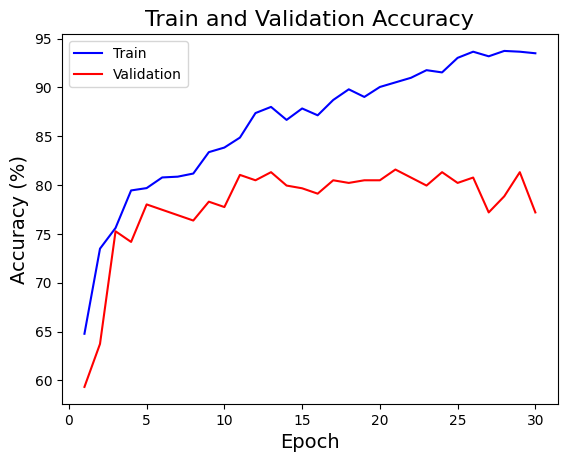

In [ ]:
optimizer = optim.SGD(model2.parameters(), lr=0.001, momentum=0.9)
train(model2, optimizer, train_loader, valid_loader, n_epoch=30, device=device)
plot()

# Evaluating the model on train,test and validation sets

**train set (model1 and model2)**

evaluating model1 on train set
Getting predictions from train set...
Accuracy: 0.9341176470588235
Precision: 0.9371173492173804
Recall: 0.9341176470588235
F1-score: 0.9334107146980438


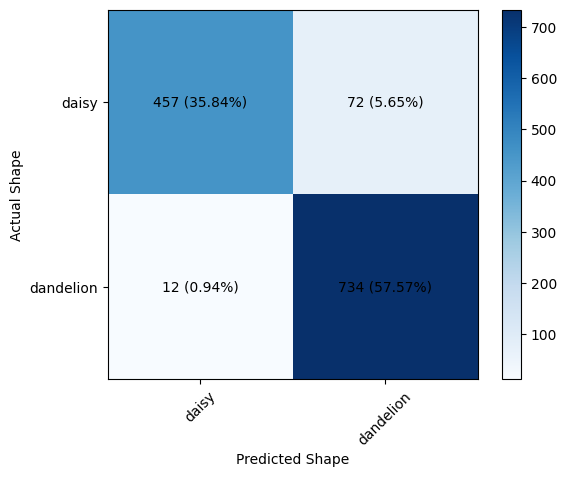

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model1.eval()
print("evaluating model1 on train set")
# Get predictions for the train data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from train set...")
truelabels = []
predictions = []
for data, target in train_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model1.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["daisy", "dandelion"]


cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()


evaluating model2 on train set
Getting predictions from train set...
Accuracy: 0.9223529411764706
Precision: 0.9314500522102332
Recall: 0.9223529411764706
F1-score: 0.920760884588458


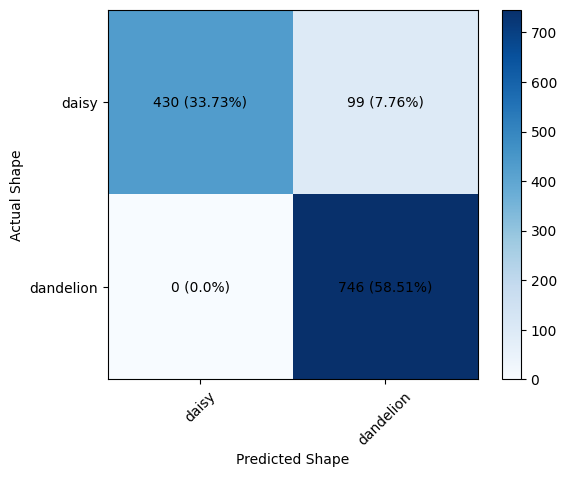

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model2.eval()
print("evaluating model2 on train set")
# Get predictions for the train data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from train set...")
truelabels = []
predictions = []
for data, target in train_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model2.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["daisy", "dandelion"]


cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()


**validation set (model1 and model2)**

evaluating model1 on validation set
Getting predictions from valid set...
Accuracy: 0.7967032967032966
Precision: 0.8036852970549161
Recall: 0.7967032967032966
F1-score: 0.7927942360517451


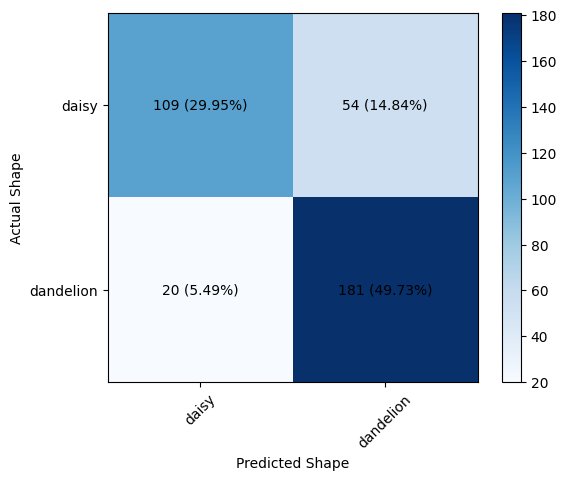

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model1.eval()
print("evaluating model1 on validation set")
# Get predictions for the train data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from valid set...")
truelabels = []
predictions = []
for data, target in valid_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model1.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["daisy", "dandelion"]


cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()


evaluating model2 on validation set
Getting predictions from valid set...
Accuracy: 0.771978021978022
Precision: 0.8179271053358644
Recall: 0.771978021978022
F1-score: 0.7566032594407881


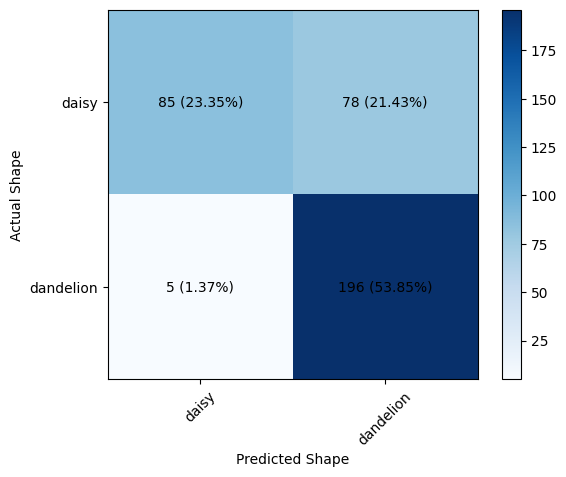

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model2.eval()
print("evaluating model2 on validation set")
# Get predictions for the train data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from valid set...")
truelabels = []
predictions = []
for data, target in valid_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model2.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["daisy", "dandelion"]


cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()


**test set (model1 and model2)**

evaluating model1 on test set
Getting predictions from test set...
Accuracy: 0.8406593406593407
Precision: 0.8518653204415161
Recall: 0.8406593406593407
F1-score: 0.8360566814715286


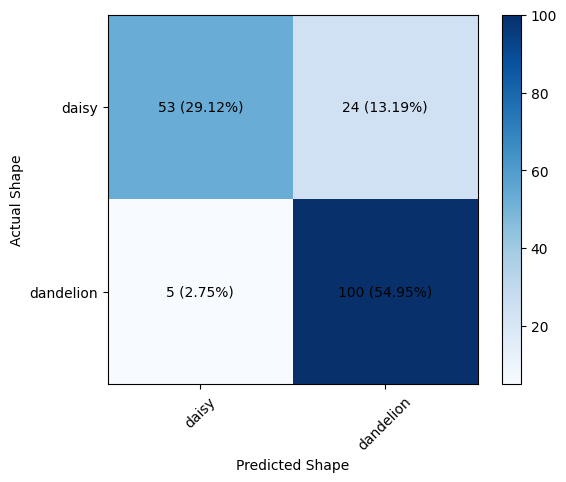

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model1.eval()
print("evaluating model1 on test set")

# Get predictions for the test data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from test set...")
truelabels = []
predictions = []
for data, target in test_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model1.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["daisy", "dandelion"]


cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()


evaluating model2 on test set
Getting predictions from test set...
Accuracy: 0.7802197802197802
Precision: 0.810792937800237
Recall: 0.7802197802197802
F1-score: 0.7659270684606004


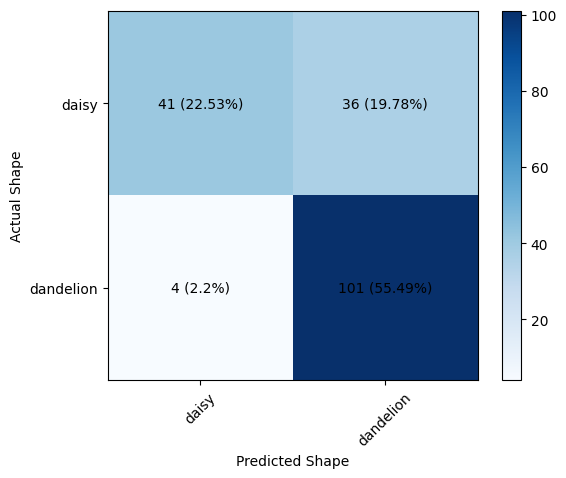

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Set the model to evaluate mode
model2.eval()
print("evaluating model2 on test set")

# Get predictions for the test data and convert to numpy arrays for use with SciKit-Learn
print("Getting predictions from test set...")
truelabels = []
predictions = []
for data, target in test_loader:
    for label in target.cpu().data.numpy():
        truelabels.append(label)
    for prediction in model2.cpu()(data).data.numpy().argmax(1):
        predictions.append(prediction)

accuracy = accuracy_score(truelabels, predictions)
precision = precision_score(truelabels, predictions, average='weighted')
recall = recall_score(truelabels, predictions, average='weighted')
f1 = f1_score(truelabels, predictions, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

classes = ["daisy", "dandelion"]

cm = confusion_matrix(truelabels, predictions)

# Add instance counts to the confusion matrix plot
for i in range(len(classes)):
    for j in range(len(classes)):
        text = f"{cm[i, j]} ({np.round(cm[i, j] / cm.sum() * 100, 2)}%)"  # Add percentage
        plt.text(j, i, text, ha="center", va="center", color="black")

# Plot the confusion matrix
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel("Predicted Shape")
plt.ylabel("Actual Shape")
plt.show()
